# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


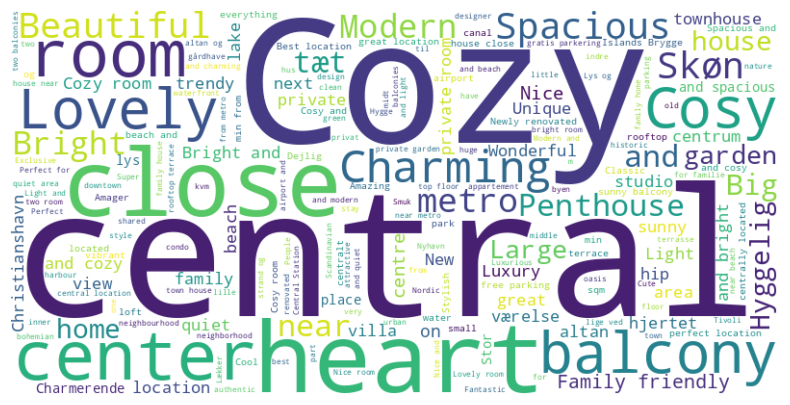

In [12]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

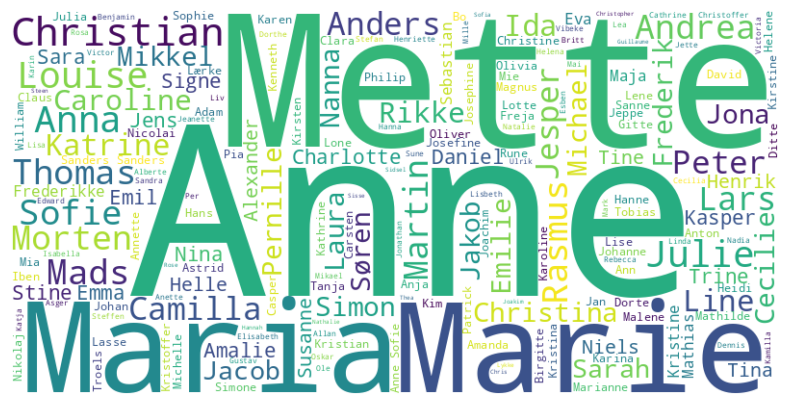

In [13]:
# Loading data
data = pd.read_csv('listings.csv', encoding='utf-8')

stop_words = ['ApartmentinCopenhagen', 'Og', 'Forenom', 'Denmark', 'Blueground', 'Rent', 'A', 'And', 'Into', 'This', 'Place']

# Convert the 'host_name' column to a single string
text = ' '.join(data_filtered['host_name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [15]:
import folium
from folium.plugins import MarkerCluster

# Get the mean of the latitude and longitude so the map can be centered when loaded
mean_lat = data_filtered['latitude'].mean()
mean_lng = data_filtered['longitude'].mean()
map = folium.Map(location=[mean_lat, mean_lng], zoom_start=12)

# Create a MarkerCluster object to be less resource intensive
marker_cluster = MarkerCluster().add_to(map)

# Add the markers to the cluster
for _, row in data_filtered.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']], 
        popup=row['name']
    ).add_to(marker_cluster)

# Display the map
map

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

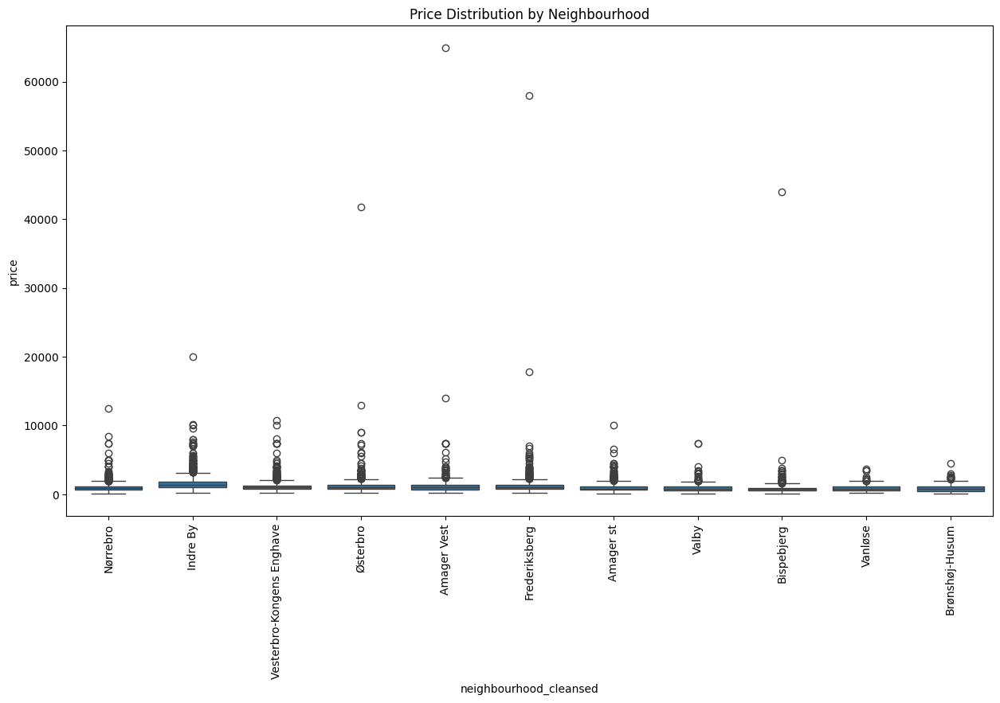

In [17]:
import seaborn as sns
plt.figure(figsize=(15, 8))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=data_filtered)
plt.title('Price Distribution by Neighbourhood')
plt.xticks(rotation=90)
plt.show()

# On the box plot can be seen prices which are big outliers and are probably a mistake

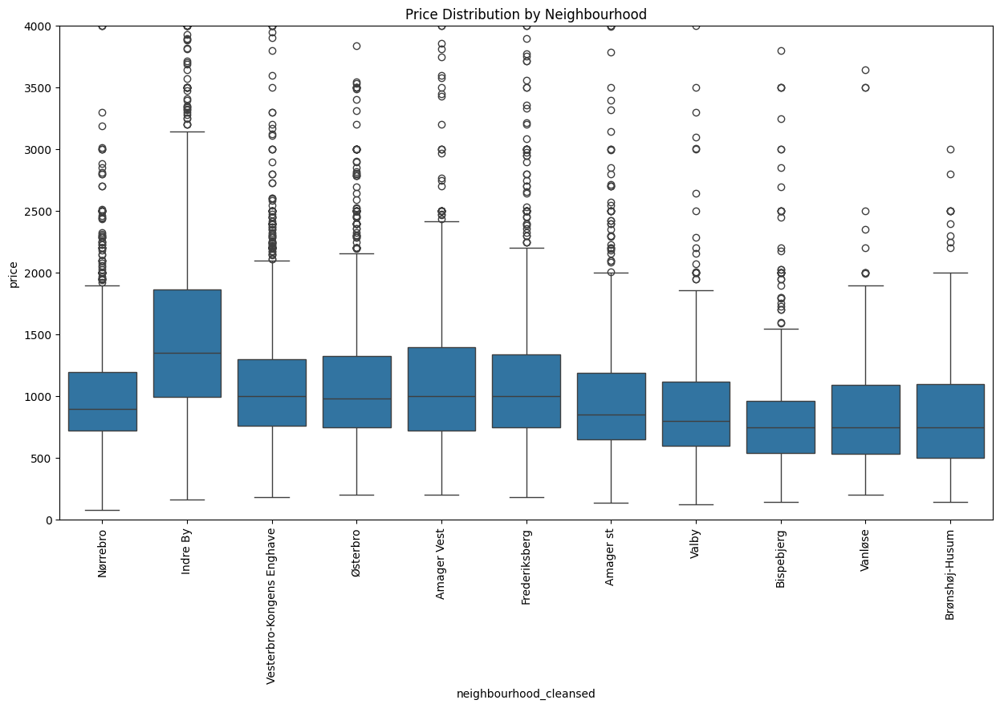

In [18]:
def cleanse_price(price):
    if price > 10000:
        return price / 10
    return price

data_filtered['price'] = data_filtered['price'].apply(cleanse_price)



plt.figure(figsize=(15, 8))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=data_filtered)
plt.title('Price Distribution by Neighbourhood')
plt.xticks(rotation=90)
plt.ylim(0, 4000)
plt.show()

# Here the outliers bigger than 10000 has been divided by 10 because it could be a input mistake. 
# The graph is now showing only from 0 to 4000 so the boxplots can be better inspected.

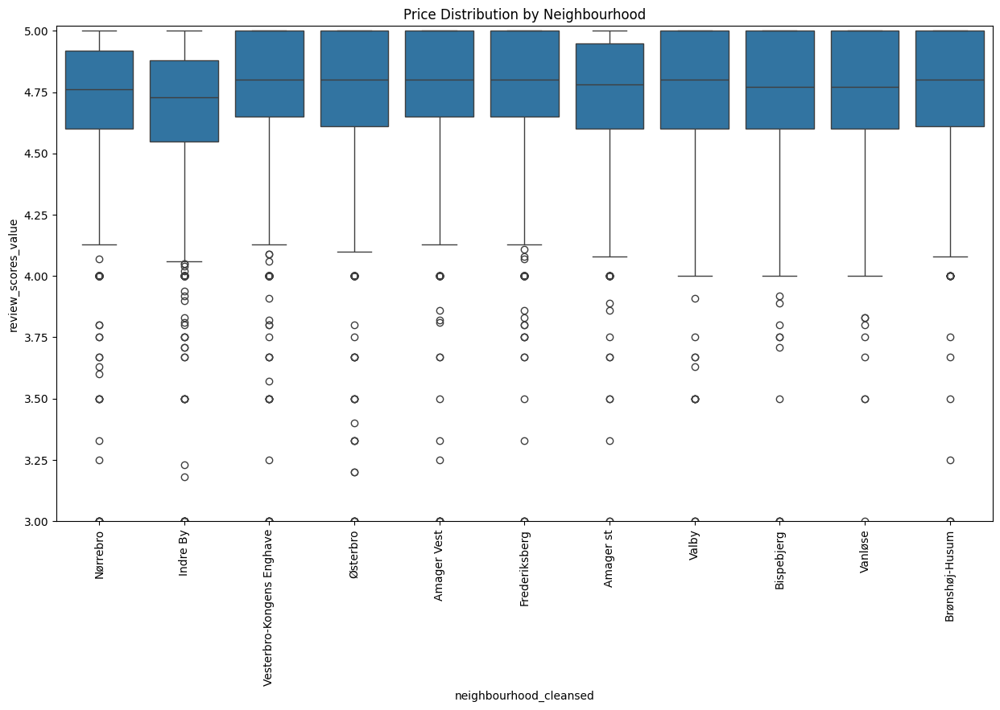

In [19]:
plt.figure(figsize=(15, 8))
sns.boxplot(x='neighbourhood_cleansed', y='review_scores_value', data=data_filtered)
plt.title('Price Distribution by Neighbourhood')
plt.xticks(rotation=90)
plt.ylim(3, 5.02)
plt.show()

### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [20]:
# State your solution here. Add more cells if needed.

import pandas as pd

# Group by 'neighbourhood_cleansed'
grouped = data_filtered.groupby('neighbourhood_cleansed')

# Descriptive analysis for 'price'
price_stats = grouped['price'].agg(['mean', 'median', 'std', 'var', 'min', 'max', 'count', 'quantile'])
price_stats['q1'] = grouped['price'].quantile(0.25)
price_stats['q3'] = grouped['price'].quantile(0.75)
price_stats['mode'] = grouped['price'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

# Descriptive analysis for 'room_type' (mode)
room_type_stats = grouped['room_type'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)

# Combine the statistics into a single DataFrame
combined_stats = price_stats[['mean', 'median', 'std', 'var', 'min', 'max', 'q1', 'q3', 'mode']].copy()
combined_stats['most_frequent_room_type'] = room_type_stats

# Display the combined descriptive statistics
print(combined_stats)


                                  mean  median         std            var  \
neighbourhood_cleansed                                                      
Amager Vest                1138.700661  1000.0  730.809006  534081.803506   
Amager st                  1019.860390   851.0  704.769611  496700.204757   
Bispebjerg                  846.503311   747.5  540.842680  292510.804301   
Brønshøj-Husum              875.487719   750.0  552.009744  304714.757771   
Frederiksberg              1158.671793  1000.0  722.350973  521790.927809   
Indre By                   1556.207104  1350.0  955.211456  912428.926596   
Nørrebro                   1009.323772   900.0  554.251893  307195.160685   
Valby                       932.137291   800.0  622.836251  387924.995986   
Vanløse                     874.543624   750.5  502.561017  252567.575532   
Vesterbro-Kongens Enghave  1109.859882   999.0  658.430806  433531.125955   
Østerbro                   1146.098084   979.0  743.098378  552195.198961   

### 5. Based on self-chosen features, develop three different regression models that can predict the price of a rental property. Remember to divide your data into training data and test data. Comment on your findings.

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report

features = ['longitude', 'latitude']
target = ['neighbourhood_cleansed']

X = data_filtered[features]
y = data_filtered[target]
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)

y_train = y_train.values.ravel()
y_test = y_test.values.ravel()

best_score = 0.001
best_value = 0

for i in range(3, 20):
    knn = KNeighborsClassifier(n_neighbors=i)

    knn.fit(X_train, y_train)
    
    score = knn.score(X_test,y_test)

    if(best_score < score):
        best_value = i
        best_score = score



print("Model accuracy on the original data: {}".format(best_score))
print("Best number of neighbours: {}".format(best_value))

Model accuracy on the original data: 0.9855729596042869
Best number of neighbours: 3


In [22]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [23]:
log_reg = LogisticRegression(random_state=42)

log_reg.fit(X_train_scaled, y_train)

print("Model accuracy on the original data: {}".format(log_reg.score(X_test_scaled, y_test)))

Model accuracy on the original data: 0.9509480626545754
